In [ ]:
!pip install shap

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import pandas as pd

In [ ]:
from google.colab import drive
drive.mount('/content/drive')
data = pd.read_csv('/content/drive/MyDrive/sim_data_full.csv')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [ ]:
#data = pd.read_csv('sim_data_full.csv')

In [ ]:
data.shape

(11994893, 15)

In [ ]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 61421 entries, 0 to 61420
Data columns (total 15 columns):
 #   Column                      Non-Null Count  Dtype  
---  ------                      --------------  -----  
 0   IPV4_SRC_ADDR               61421 non-null  object 
 1   L4_SRC_PORT                 61421 non-null  int64  
 2   IPV4_DST_ADDR               61421 non-null  object 
 3   L4_DST_PORT                 61421 non-null  int64  
 4   PROTOCOL                    61421 non-null  int64  
 5   L7_PROTO                    61421 non-null  float64
 6   IN_BYTES                    61421 non-null  int64  
 7   OUT_BYTES                   61421 non-null  int64  
 8   IN_PKTS                     61421 non-null  int64  
 9   OUT_PKTS                    61421 non-null  int64  
 10  TCP_FLAGS                   61421 non-null  int64  
 11  FLOW_DURATION_MILLISECONDS  61421 non-null  int64  
 12  Label                       61421 non-null  int64  
 13  Attack                      614

In [ ]:
print(data['Attack'].unique(),len(data['Attack'].unique()))

['Benign' 'Exploits' 'Reconnaissance' 'DoS' 'Generic' 'Shellcode'
 'Backdoor' 'Fuzzers' 'Worms' 'Analysis' 'injection' 'DDoS' 'scanning'
 'password' 'mitm' 'xss' 'ransomware' 'Infilteration' 'Bot' 'Brute Force'
 'Theft'] 21


In [ ]:
data['Label'].value_counts()

Label
0    9208048
1    2786845
Name: count, dtype: int64

In [ ]:
data.drop(["Label", "IPV4_DST_ADDR", "IPV4_SRC_ADDR","Dataset"], inplace = True, axis = 1)

In [ ]:
data.isna().sum()

L4_SRC_PORT                   0
L4_DST_PORT                   0
PROTOCOL                      0
L7_PROTO                      0
IN_BYTES                      0
OUT_BYTES                     0
IN_PKTS                       0
OUT_PKTS                      0
TCP_FLAGS                     0
FLOW_DURATION_MILLISECONDS    0
Attack                        0
dtype: int64

In [ ]:
data=data.dropna()
data.isna().sum()

L4_SRC_PORT                   0
L4_DST_PORT                   0
PROTOCOL                      0
L7_PROTO                      0
IN_BYTES                      0
OUT_BYTES                     0
IN_PKTS                       0
OUT_PKTS                      0
TCP_FLAGS                     0
FLOW_DURATION_MILLISECONDS    0
Attack                        0
dtype: int64

In [ ]:
data.shape

(11994893, 11)

In [ ]:
data['Attack'].value_counts()

Attack
Benign            9208048
DDoS               763285
Reconnaissance     482946
injection          468575
DoS                348962
Brute Force        291955
password           156299
xss                 99944
Infilteration       62072
Exploits            24736
scanning            21467
Fuzzers             19463
Backdoor            19029
Bot                 15683
Generic              5570
Analysis             1995
Theft                1909
Shellcode            1365
mitm                 1295
Worms                 153
ransomware            142
Name: count, dtype: int64

In [ ]:
# Splitting the data
benign_data = data[data['Attack'] == 'Benign']
other_data = data[data['Attack'] != 'Benign']

# Downsample the 'Benign' data points
benign_sampled = benign_data.sample(n=1000000, random_state=42)

# Combine the downsampled 'Benign' data with the other classes
final_data = pd.concat([benign_sampled, other_data])
# Shuffle the DataFrame
final_data_shuffled = final_data.sample(frac=1, random_state=42).reset_index(drop=True)
data=final_data_shuffled
data['Attack'].value_counts()

Attack
Benign            1000000
DDoS               763285
Reconnaissance     482946
injection          468575
DoS                348962
Brute Force        291955
password           156299
xss                 99944
Infilteration       62072
Exploits            24736
scanning            21467
Fuzzers             19463
Backdoor            19029
Bot                 15683
Generic              5570
Analysis             1995
Theft                1909
Shellcode            1365
mitm                 1295
Worms                 153
ransomware            142
Name: count, dtype: int64

In [ ]:
import numpy as np
import pandas as pd
from sklearn.model_selection import train_test_split
from sklearn.tree import DecisionTreeClassifier
from sklearn.metrics import classification_report
from imblearn.over_sampling import SMOTE
import shap

In [ ]:
from sklearn.preprocessing import LabelEncoder
X = data.drop('Attack', axis=1)

y = data['Attack']


print(data.head(3))

# Split data into training and test sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

   L4_SRC_PORT  L4_DST_PORT  PROTOCOL  L7_PROTO  IN_BYTES  OUT_BYTES  IN_PKTS  \
0        34586           80         6     0.000     17765          0      142   
1        51222          443         6    91.178       891        389        7   
2        53458           80         6     7.000       559      12815        6   

   OUT_PKTS  TCP_FLAGS  FLOW_DURATION_MILLISECONDS     Attack  
0         0         27                           0        DoS  
1         6        219                     4289460     Benign  
2        12         27                        3304  injection  


In [ ]:
X_train.shape

(3029476, 10)

In [ ]:
import pandas as pd


# Randomly sample few data points for testing purpose
sampled_df = X_test.sample(n=15, random_state=42)

# sampled_df is now a DataFrame containing 10 randomly selected entries from X_test
print("Randomly selected 10 data points:")
sampled_df.head(2)


Randomly selected 10 data points:


,L4_SRC_PORT,L4_DST_PORT,PROTOCOL,L7_PROTO,IN_BYTES,OUT_BYTES,IN_PKTS,OUT_PKTS,TCP_FLAGS,FLOW_DURATION_MILLISECONDS
1621075,14392,12208,6,0.0,40,40,1,1,22,4294967
186976,22253,3389,6,0.0,2031,2103,14,9,219,4291046


In [ ]:
# Save the DataFrame to a CSV file
sampled_df.to_csv('sampled_data.csv', index=False)

print("DataFrame saved as CSV successfully!")


DataFrame saved as CSV successfully!


In [ ]:
# Handling imbalance
smote = SMOTE()
X_train_sm, y_train_sm = smote.fit_resample(X_train, y_train)
type(X_train_sm)

pandas.core.frame.DataFrame

In [ ]:
X_train_sm.shape

(16798740, 10)

In [ ]:
y_train.value_counts()

Attack
Benign            799940
DDoS              610415
Reconnaissance    386543
injection         374880
DoS               279161
Brute Force       233692
password          124943
xss                79810
Infilteration      49729
Exploits           19907
scanning           17259
Fuzzers            15537
Backdoor           15094
Bot                12582
Generic             4504
Analysis            1599
Theft               1520
Shellcode           1095
mitm                1025
Worms                125
ransomware           116
Name: count, dtype: int64

In [ ]:
# # Train a decision tree classifier with tuned hyper parameters
# clf = DecisionTreeClassifier(class_weight='balanced',criterion= 'entropy', max_depth= 30, min_samples_leaf= 1, min_samples_split= 2)
# clf.fit(X_train_sm, y_train_sm)


DecisionTreeClassifier(class_weight='balanced', criterion='entropy',
                       max_depth=30)

In [ ]:
# # Predictions
# y_pred = clf.predict(X_test)

# # Evaluation
# print(classification_report(y_test, y_pred))

                precision    recall  f1-score   support

      Analysis       0.14      0.77      0.24       396
      Backdoor       0.96      0.92      0.94      3935
        Benign       0.96      0.89      0.92    200060
           Bot       1.00      1.00      1.00      3101
   Brute Force       0.73      1.00      0.84     58263
          DDoS       0.89      0.77      0.83    152870
           DoS       0.69      0.60      0.64     69801
      Exploits       0.83      0.84      0.83      4829
       Fuzzers       0.86      0.84      0.85      3926
       Generic       0.67      0.60      0.63      1066
 Infilteration       0.22      0.50      0.31     12343
Reconnaissance       0.98      0.93      0.95     96403
     Shellcode       0.89      0.93      0.91       270
         Theft       0.53      0.91      0.67       389
         Worms       0.35      0.57      0.43        28
     injection       0.62      0.40      0.49     93695
          mitm       0.28      0.60      0.39  

In [ ]:
y_test.unique()

array(['Infilteration', 'injection', 'Brute Force', 'Reconnaissance',
       'DDoS', 'Benign', 'DoS', 'xss', 'Bot', 'password', 'scanning',
       'Exploits', 'Backdoor', 'Generic', 'Fuzzers', 'Shellcode',
       'Analysis', 'Theft', 'mitm', 'Worms', 'ransomware'], dtype=object)

In [ ]:
# import pickle

# model = clf

# # Save the model to a local file
# with open('sim_model.pkl', 'wb') as file:
#     pickle.dump(model, file)



In [ ]:
import pickle

# Path to your model file on Google Drive
model_path = '/content/drive/MyDrive/sim_model.pkl'

# Load the model from the file
with open(model_path, 'rb') as file:
    clf = pickle.load(file)

print("Model loaded successfully!")

# Shap

In [ ]:
import shap
explainer = shap.TreeExplainer(model=clf,
                               data=None,
                               model_output='raw',
                               feature_perturbation='tree_path_dependent')

shap_values = explainer.shap_values(X_train_sm)

#SHAP values summary
print(f'Shape of dataset: {X_train_sm.shape}')
print(f'Type of shap_values: {type(shap_values)}. Length of the list: {len(shap_values)}')
print(f'Shape of shap_values: {np.array(shap_values).shape}')
print("Expected Values for each class:", explainer.expected_value)

In [ ]:
#Force plot for 1 observation
shap.initjs()
i = 1
shap.force_plot(explainer.expected_value[1], shap_values[1][i,:], features=X_train.iloc[i, :])

In [ ]:
#Force plot for first 100 observations
shap.initjs()
shap.force_plot(explainer.expected_value[1], shap_values[1][:100,:], features=X_train.iloc[:100, :])

### Hyper Parameter Tuning

In [ ]:

# from sklearn.model_selection import GridSearchCV, StratifiedKFold

# # Setup the parameter grid
# param_grid = {
#     'max_depth': [None, 10, 20, 30],
#     'min_samples_split': [2, 5, 10],
#     'min_samples_leaf': [1, 2, 5],
#     'criterion': ['gini', 'entropy']
# }

# # Define a stratified k-fold to ensure each fold is representative of all classes
# stratified_k_fold = StratifiedKFold(n_splits=5, shuffle=True, random_state=42)

# # Setup the GridSearchCV with a 5-fold cross-validation
# grid_search = GridSearchCV(estimator=clf,
#                            param_grid=param_grid,
#                            scoring='f1_macro',  # Using F1 macro scoring
#                            cv=stratified_k_fold,
#                            verbose=1,
#                            n_jobs=-1)

# # Fit the grid search
# grid_search.fit(X_train_sm, y_train_sm)

# # Best parameters and best score
# print("Best parameters:", grid_search.best_params_)
# print("Best cross-validation F1 macro score: {:.2f}".format(grid_search.best_score_))

# # Optionally, use the best estimator for further predictions
# best_clf = grid_search.best_estimator_


Fitting 5 folds for each of 72 candidates, totalling 360 fits
Best parameters: {'criterion': 'entropy', 'max_depth': 30, 'min_samples_leaf': 1, 'min_samples_split': 2}
Best cross-validation F1 macro score: 0.75


### Shap Testing

In [ ]:
test_df=pd.read_csv('sampled_data.csv')
test_df.shape

(15, 10)

In [ ]:
class_labels = ['Benign', 'Exploits', 'Reconnaissance', 'DoS', 'Generic', 'Shellcode',
                'Backdoor', 'Fuzzers', 'Worms', 'Analysis', 'injection', 'DDoS', 'scanning',
                'password', 'mitm', 'xss', 'ransomware', 'Infilteration', 'Bot', 'Brute Force',
                'Theft']

In [ ]:
import shap
from IPython.display import display, HTML

# Setup the SHAP explainer
explainer = shap.TreeExplainer(model=loaded_model)

# Initialize SHAP JS visualization
shap.initjs()

# Iterate over the first 5 samples
for i in range(5):
    # Prepare the data point for prediction and explanation
    new_data = test_df.iloc[i:i+1]

    # Make a prediction
    prediction = loaded_model.predict(new_data)
    print("Prediction:", prediction)

    # Compute SHAP values
    shap_values_new = explainer.shap_values(new_data)

    # Find the predicted class index from the class labels
    predicted_class_index = class_labels.index(prediction[0])

    # SHAP values for the predicted class for all features
    shap_values_for_prediction = shap_values_new[0, :, predicted_class_index]

    # # Print shapes and types for debugging
    # print("Expected Values (one for each class):", explainer.expected_value)
    # print("Type of SHAP values:", type(shap_values_new))
    # print("Shape of SHAP values:", np.array(shap_values_new).shape)

    # Create and display the SHAP force plot
    force_plot_html = shap.force_plot(
        explainer.expected_value[predicted_class_index],  # Expected value for the predicted class
        shap_values_for_prediction,                      # SHAP values for the predicted class
        new_data.iloc[0],                                # Feature values of the data point
        feature_names=test_df.columns.tolist(),          # Feature names
        link='logit',                                    # Use 'logit' link function for probability output
        show=False                                       # Do not automatically show the plot
    )
    display(force_plot_html)


Prediction: ['Reconnaissance']
Expected Values (one for each class): [0.04761905 0.04761905 0.04761905 0.04761905 0.04761905 0.04761905
 0.04761905 0.04761905 0.04761905 0.04761905 0.04761905 0.04761905
 0.04761905 0.04761905 0.04761905 0.04761905 0.04761905 0.04761905
 0.04761905 0.04761905 0.04761905]
Type of SHAP values: <class 'numpy.ndarray'>
Shape of SHAP values: (1, 10, 21)


Prediction: ['Benign']
Expected Values (one for each class): [0.04761905 0.04761905 0.04761905 0.04761905 0.04761905 0.04761905
 0.04761905 0.04761905 0.04761905 0.04761905 0.04761905 0.04761905
 0.04761905 0.04761905 0.04761905 0.04761905 0.04761905 0.04761905
 0.04761905 0.04761905 0.04761905]
Type of SHAP values: <class 'numpy.ndarray'>
Shape of SHAP values: (1, 10, 21)


Prediction: ['DoS']
Expected Values (one for each class): [0.04761905 0.04761905 0.04761905 0.04761905 0.04761905 0.04761905
 0.04761905 0.04761905 0.04761905 0.04761905 0.04761905 0.04761905
 0.04761905 0.04761905 0.04761905 0.04761905 0.04761905 0.04761905
 0.04761905 0.04761905 0.04761905]
Type of SHAP values: <class 'numpy.ndarray'>
Shape of SHAP values: (1, 10, 21)


Prediction: ['Benign']
Expected Values (one for each class): [0.04761905 0.04761905 0.04761905 0.04761905 0.04761905 0.04761905
 0.04761905 0.04761905 0.04761905 0.04761905 0.04761905 0.04761905
 0.04761905 0.04761905 0.04761905 0.04761905 0.04761905 0.04761905
 0.04761905 0.04761905 0.04761905]
Type of SHAP values: <class 'numpy.ndarray'>
Shape of SHAP values: (1, 10, 21)


Prediction: ['password']
Expected Values (one for each class): [0.04761905 0.04761905 0.04761905 0.04761905 0.04761905 0.04761905
 0.04761905 0.04761905 0.04761905 0.04761905 0.04761905 0.04761905
 0.04761905 0.04761905 0.04761905 0.04761905 0.04761905 0.04761905
 0.04761905 0.04761905 0.04761905]
Type of SHAP values: <class 'numpy.ndarray'>
Shape of SHAP values: (1, 10, 21)


# Lime

In [ ]:
!pip install lime

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 275.7/275.7 kB 5.4 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
  Created wheel for lime: filename=lime-0.2.0.1-py3-none-any.whl size=283835 sha256=e8974e1504edc2206026751b834fd0f6e863e2ad145a189ccfd2d313d99b3de1
  Stored in directory: /root/.cache/pip/wheels/fd/a2/af/9ac0a1a85a27f314a06b39e1f492bee1547d52549a4606ed89
Successfully built lime


In [ ]:
from lime.lime_tabular import LimeTabularExplainer

explainer = LimeTabularExplainer(
    training_data=X_train.values,
    feature_names=X_train.columns.tolist(),
    class_names=[str(cls) for cls in range(10)],
    mode='classification',
    discretize_continuous=True
)


In [ ]:
i = 0
new_data = X_test.iloc[i:i+1]


In [ ]:
exp = explainer.explain_instance(
    data_row=new_data.values[0],
    predict_fn=clf.predict_proba,
    num_features=10
)


In [ ]:
# Display the explanation
exp.show_in_notebook(show_table=True, show_all=False)


### Lime Testing

Instance 0
Predicted Class: Reconnaissance
True Class: Infilteration


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:439: UserWarning: X does not have valid feature names, but DecisionTreeClassifier was fitted with feature names
  warnings.warn(


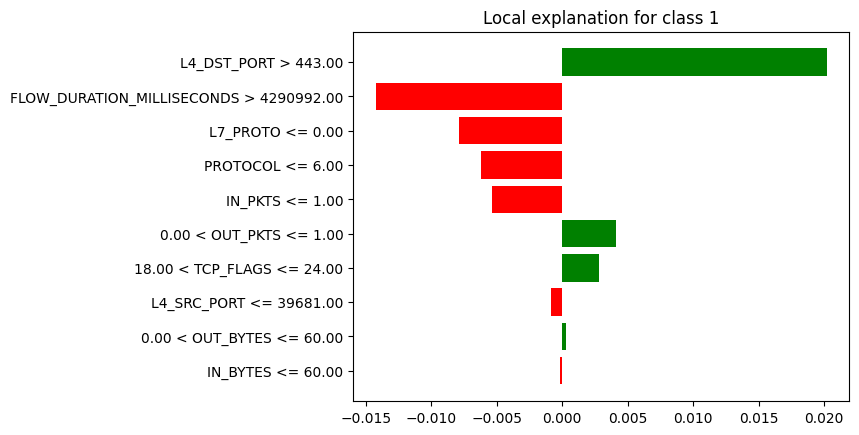

Instance 1
Predicted Class: Benign
True Class: injection


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:439: UserWarning: X does not have valid feature names, but DecisionTreeClassifier was fitted with feature names
  warnings.warn(


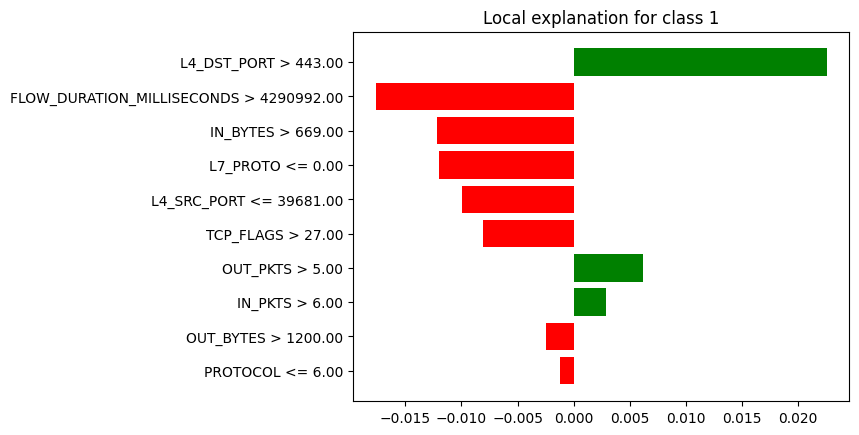

Instance 2
Predicted Class: DoS
True Class: Brute Force


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:439: UserWarning: X does not have valid feature names, but DecisionTreeClassifier was fitted with feature names
  warnings.warn(


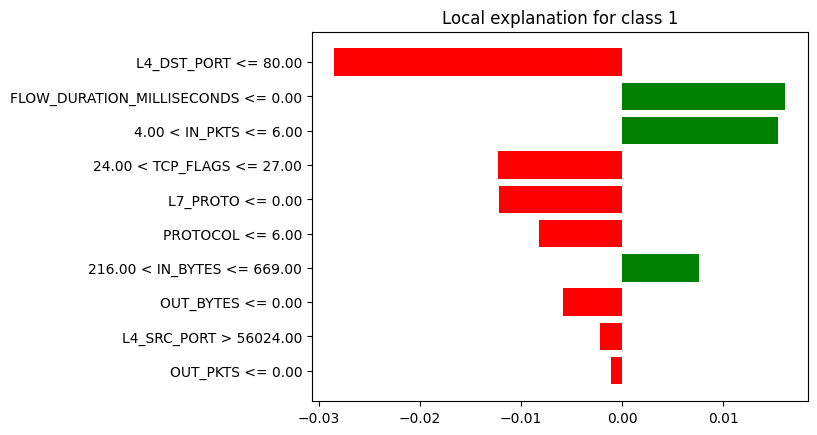

Instance 3
Predicted Class: Benign
True Class: Brute Force


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:439: UserWarning: X does not have valid feature names, but DecisionTreeClassifier was fitted with feature names
  warnings.warn(


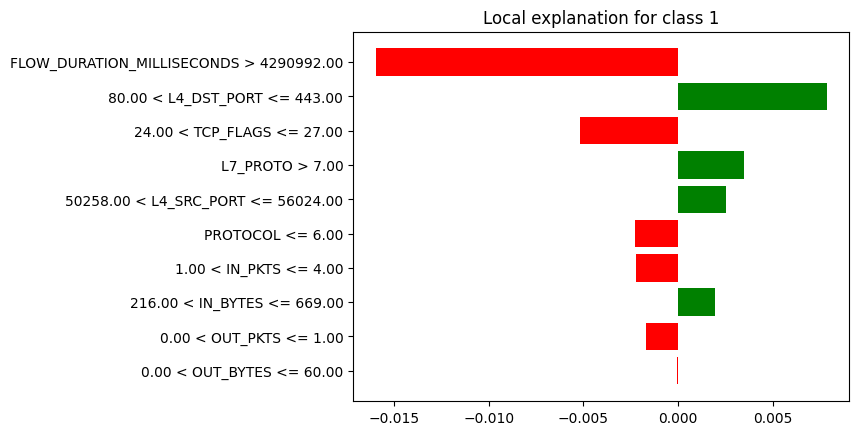

Instance 4
Predicted Class: password
True Class: Reconnaissance


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:439: UserWarning: X does not have valid feature names, but DecisionTreeClassifier was fitted with feature names
  warnings.warn(


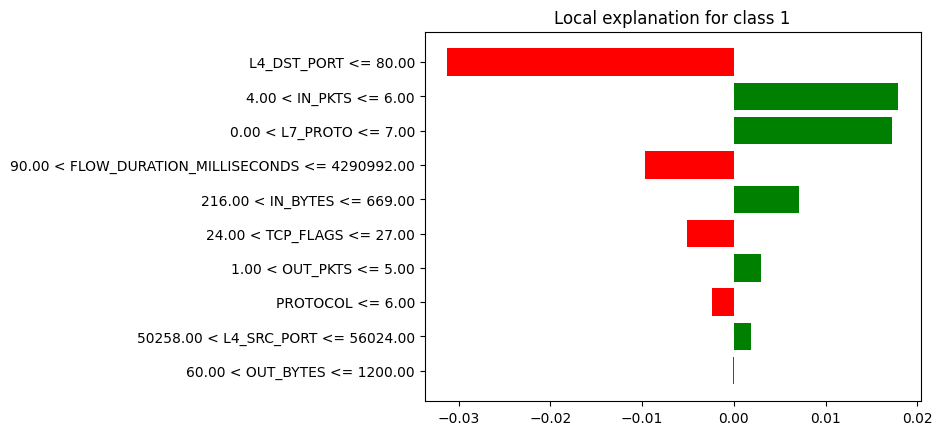

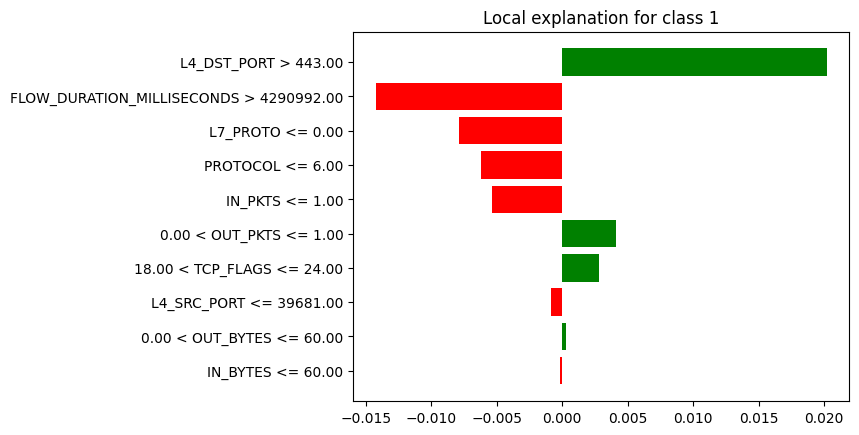

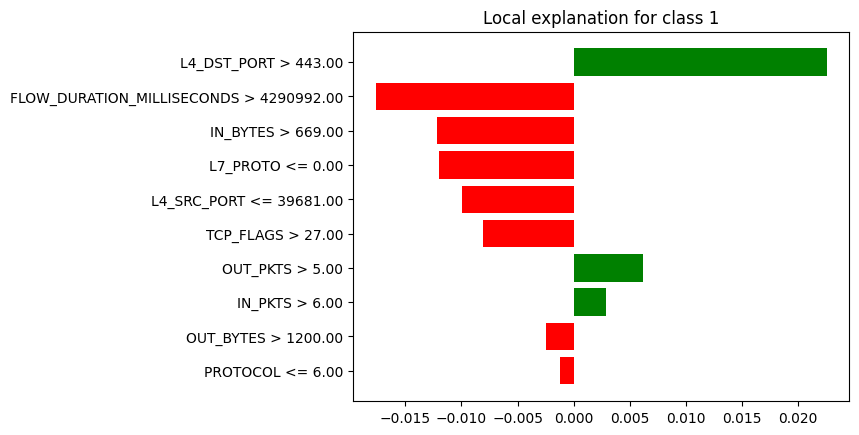

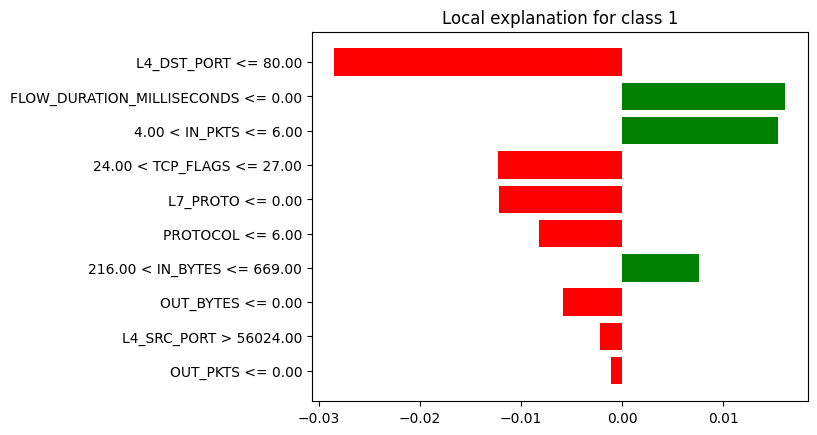

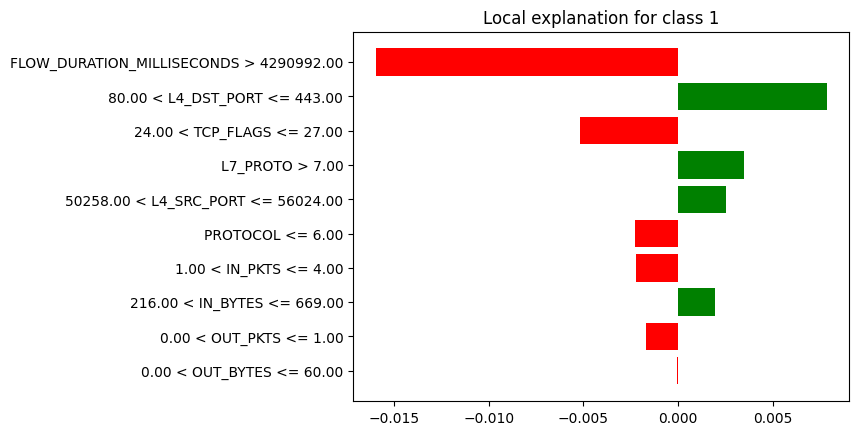

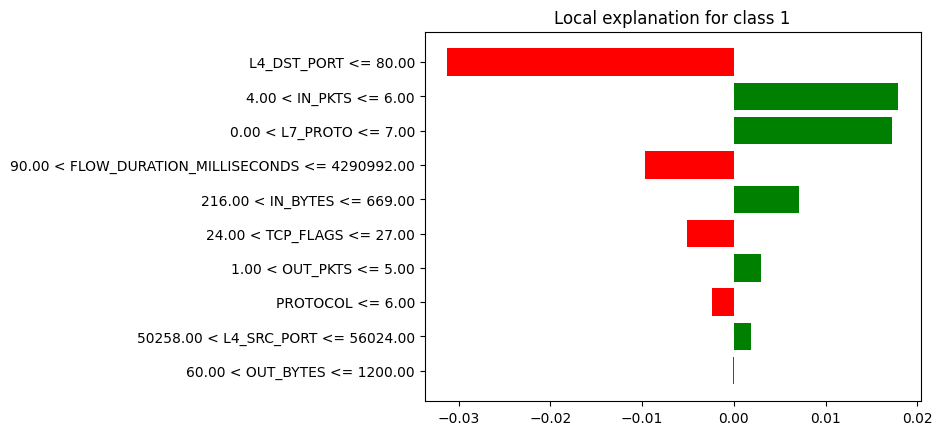

In [ ]:
import lime
from IPython.display import display

for i in range(5):  # example for explaining 5 instances
    new_data = test_df.iloc[i:i+1]
    exp = explainer.explain_instance(
        data_row=new_data.values[0],
        predict_fn=clf.predict_proba,
        num_features=10
    )
    print("Instance", i)
    print("Predicted Class:", clf.predict(new_data)[0])

    exp.show_in_notebook(show_table=True, show_all=False)
    display(exp.as_pyplot_figure())  # optional: plot as static matplotlib figure
